In [1]:
import os
import sys
sys.path.append(os.path.abspath('../'))

import math
import time
import datetime
import numpy as np
from numpy.lib.stride_tricks import sliding_window_view
import torch
from torch.utils.data import Dataset
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
from torch.optim.lr_scheduler import CosineAnnealingLR, LambdaLR
from matcho import Unet2D
# from YourDataset import YourDataset  # Import your custom dataset here
from tqdm import tqdm
from torch.cuda.amp import autocast, GradScaler
from torchinfo import summary
import torchprofile

import pickle

torch.manual_seed(23)

scaler = GradScaler()

DTYPE = torch.float32
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams["figure.dpi"] = 200
plt.rcParams["font.family"] = "serif"

import scipy.stats as stats
import cartopy.crs as ccrs
import pandas as pd

Using device: cuda


In [2]:
# Define your custom loss function here
class CustomLoss(nn.Module):
    def __init__(self, Par):
        super(CustomLoss, self).__init__()
        self.Par = Par

    def forward(self, y_pred, y_true):
        # Implement your custom loss calculation here
        # loss = torch.mean((y_pred - y_true) ** 2)  # Example: Mean Squared Error
        y_true = (y_true - self.Par["out_shift"])/self.Par["out_scale"]
        y_pred = (y_pred - self.Par["out_shift"])/self.Par["out_scale"]
        loss = torch.norm(y_true-y_pred, p=2)/torch.norm(y_true, p=2)
        return loss

class YourDataset_train(Dataset):
    def __init__(self, x, t, y, transform=None):
        self.x = x
        self.t = t
        self.y = y
        self.transform = transform

    def __len__(self):
        return len(self.x)

    def __getitem__(self, idx):
        x_sample = self.x[idx]
        t_sample = self.t[idx]
        y_sample = self.y[idx]

        if self.transform:
            x_sample, t_sample, y_sample = self.transform(x_sample, t_sample, y_sample)

        return x_sample, t_sample, y_sample
    
class YourDataset(Dataset):
    def __init__(self, x, y, transform=None):
        self.x = x
        self.y = y
        self.transform = transform

    def __len__(self):
        return len(self.x)

    def __getitem__(self, idx):
        x_sample = self.x[idx]
        y_sample = self.y[idx]

        if self.transform:
            x_sample, y_sample = self.transform(x_sample, y_sample)

        return x_sample, y_sample


# def preprocess(traj, Par):
#     x = sliding_window_view(traj[:,:-(Par['lf']),:,:,:,:], window_shape=Par['lb'], axis=1 ).transpose(0,1,6,2,3,4,5).reshape(-1,Par['lb'], Par['nf'], Par['nth'], Par['nr'], Par['nx'])
#     y = sliding_window_view(traj[:,Par['lb']:,:,:,:,:], window_shape=Par['lf'], axis=1 ).transpose(0,1,6,2,3,4,5).reshape(-1,Par['lf'], Par['nf'], Par['nth'], Par['nr'], Par['nx'])
#     t = np.linspace(0,1,Par['lf']).reshape(-1,1)

#     nt = y.shape[1]
#     n_samples = y.shape[0]

#     t = np.tile(t, [n_samples,1]).reshape(-1,)                                                     #[_*nt, ]
#     x = np.repeat(x,nt, axis=0)                                   #[_*nt, 1, 64, 64]
#     y = y.reshape(y.shape[0]*y.shape[1],1,y.shape[2],y.shape[3])  #[_*nt, 64, 64]


#     print('x: ', x.shape)
#     print('y: ', y.shape)
#     print('t: ', t.shape)
#     print()
#     return x,y,t

def preprocess_train(traj, Par):
    nsamples = traj.shape[0]
    nt = traj.shape[1]
    temp = nt - Par['lb'] - Par['lf'] + 1
    x_idx = np.arange(temp).reshape(-1,1)
    x_idx = np.tile(x_idx, (1, Par['lf'])).reshape(-1,1)

    x_idx_ls = []
    for i in range(Par["lb"]):
        x_idx_ls.append(x_idx+i)
    x_idx = np.concatenate(x_idx_ls, axis=1)

    t_idx = np.arange(Par['lf']).reshape(1,-1)

    t_idx = np.tile(t_idx, (temp,1)).reshape(-1,)

    y_idx = np.arange(nt)
    y_idx = sliding_window_view(y_idx[Par['lb']:], window_shape=Par['lf']).reshape(-1,)

    print(f"x_idx: {x_idx.shape}")
    print(f"t_idx: {t_idx.shape}")
    print(f"y_idx: {y_idx.shape}")

    return x_idx, t_idx, y_idx

def preprocess(traj, Par):
    nsamples = traj.shape[0]
    nt = traj.shape[1]
    temp = nt - Par['lb'] - Par['LF'] + 1
    x_idx = np.arange(temp).reshape(-1,1)
    # x_idx = np.tile(x_idx, (1, Par['LF'])).reshape(-1,1)

    x_idx_ls = []
    for i in range(Par["lb"]):
        x_idx_ls.append(x_idx+i)
    x_idx = np.concatenate(x_idx_ls, axis=1)

    t_idx = np.arange(Par['lf']).reshape(-1,)
    # t_idx = np.tile(t_idx, (temp,1)).reshape(-1,)

    y_idx = np.arange(nt)
    y_idx = sliding_window_view(y_idx[Par['lb']:], window_shape=Par['LF'])#.reshape(-1,)

    print(f"x_idx: {x_idx.shape}")
    print(f"t_idx: {t_idx.shape}")
    print(f"y_idx: {y_idx.shape}")

    return x_idx, t_idx, y_idx


def combined_scheduler(optimizer, total_epochs, warmup_epochs, last_epoch=-1):
    def lr_lambda(epoch):
        if epoch < warmup_epochs:
            return float(epoch + 1) / warmup_epochs
        else:
            return 0.5 * (1 + math.cos(math.pi * (epoch - warmup_epochs) / (total_epochs - warmup_epochs)))

    return LambdaLR(optimizer, lr_lambda, last_epoch)


def rollout(model, x,t,NT, Par, batch_size):
    # x - [bs, lb, nf, nx,ny]
    # t - [lf,]
    # NT - length of target time-series

    # print('NT: ', NT)

    y_pred_ls = []
    # lf = 
    # nx = 64
    # ny = 64

    bs = batch_size
    end= bs
    # for end in range(bs, x.shape[0]+1, bs):
    while True:
        start = end-bs
        out_ls = []
        
        temp_x1 = x[start:end] #[BS, lb, nf, nx,ny]
        out_ls = [temp_x1.to(device)]
        traj = torch.cat(out_ls, dim=1)

        while traj.shape[1] < NT:
            # model.eval()
            with torch.no_grad():
                temp_x = torch.repeat_interleave(temp_x1, Par['lf'], dim=0) #[BS*lf, lb, nf, nx,ny]
                temp_t = t.repeat(traj.shape[0]) #[BS*lf, ]
                with autocast():
                    out = model(temp_x.to(device), temp_t.to(device)).reshape(-1,Par['lf'], Par['nf'],Par['nx'],Par['ny']) #[BS, lf, nf, nx,ny]
                # print('out: ', out.shape)
                out_ls.append(out)
                traj = torch.cat(out_ls, dim=1)
                temp_x1 = traj[:,-Par['lb']:] #[BS, lb, nf, nx,ny]
                
        pred = torch.cat(out_ls, dim=1)[:, Par['lb']:NT] #[BS, lf, nf, nx, ny]
        # print('pred: ', pred.shape)
        y_pred_ls.append(pred)

        end = end+bs
        if end-bs > x.shape[0]+1:
            break
    
    # print("hello")
    # print(y_pred_ls)
    y_pred = torch.cat(y_pred_ls, dim=0)#.reshape(1,-1,Par['nz'],Par['ny'],Par['nx'])
    # print('y_pred: ', y_pred.shape)

    return y_pred

In [3]:
# Load your data into NumPy arrays (x_train, t_train, y_train, x_val, t_val, y_val, x_test, t_test, y_test)
#########################
res = 128
begin_time = time.time()
traj = np.load(f"../../data/UX_nan_filtered.npy") #[nt, nx, ny]
traj = np.expand_dims(traj, axis=0) #[1, nt, nx, ny]
mask = np.load("../../data/mask.npy").reshape(1,1,traj.shape[-2], traj.shape[-1])
traj = traj * mask
traj = np.expand_dims(traj, axis=2) #[1, nt, nf, nx, ny]
print(f"traj: {traj.shape}")
print(f"Data Loading Time: {time.time() - begin_time:.1f}s")


traj_train = traj[:, :800]
traj_val   = traj[:, 800:900,]
traj_test  = traj[:, 900:]

Par = {}
# Par['nt'] = 100 
Par['nx'] = traj_train.shape[-2]
Par['ny'] = traj_train.shape[-1]
Par['nf'] = 1
Par['d_emb'] = 128

Par['lb'] = 10
Par['lf'] = 2
Par['LF'] = 60
Par['channels'] = Par['nf']*Par['lb']
# Par['temp'] = Par['nt'] - Par['lb'] - Par['lf'] + 2

Par['num_epochs'] = 500 #50

time_cond = np.linspace(0, 1, Par['lf'])
if Par['lf']==1:
    time_cond = np.linspace(0, 1, Par['lf']) + 1


begin_time = time.time()
print('\nTrain Dataset')
x_idx_train, t_idx_train, y_idx_train = preprocess(traj_train, Par)
print('\nValidation Dataset')
x_idx_val, t_idx_val, y_idx_val  = preprocess(traj_val, Par)
print('\nTest Dataset')
x_idx_test, t_idx_test, y_idx_test  = preprocess(traj_test, Par)
print(f"Data Preprocess Time: {time.time() - begin_time:.1f}s")

# sys.exit()

t_min = np.min(time_cond)
t_max = np.max(time_cond)
if Par['lf']==1:
    t_min=0
    t_max=1


Par['inp_shift'] = np.mean(traj_train) 
Par['inp_scale'] = np.std(traj_train)
Par['out_shift'] = np.mean(traj_train)
Par['out_scale'] = np.std(traj_train)
Par['t_shift']   = t_min
Par['t_scale']   = t_max - t_min


# with open('Par.pkl', 'wb') as f:
#     pickle.dump(Par, f)

# sys.exit()
#########################

# Create custom datasets
mask_tensor = torch.tensor(mask, dtype=DTYPE, device=device)

Par["mask"] = mask_tensor

# Create custom datasets
traj_train_tensor = torch.tensor(traj_train, dtype=DTYPE)
traj_val_tensor = torch.tensor(traj_val, dtype=DTYPE)
traj_test_tensor = torch.tensor(traj_test, dtype=DTYPE)
time_cond_tensor = torch.tensor(time_cond, dtype=DTYPE)


train_dataset = YourDataset(x_idx_train, y_idx_train)
val_dataset = YourDataset(x_idx_val, y_idx_val)
test_dataset = YourDataset(x_idx_test, y_idx_test)


# Define data loaders
train_batch_size = 20 #100
val_batch_size   = 20 #100
test_batch_size  = 20 #100
train_loader = DataLoader(train_dataset, batch_size=train_batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=val_batch_size)
test_loader = DataLoader(test_dataset, batch_size=test_batch_size)

traj: (1, 1000, 1, 128, 512)
Data Loading Time: 1.8s

Train Dataset
x_idx: (731, 10)
t_idx: (2,)
y_idx: (731, 60)

Validation Dataset
x_idx: (31, 10)
t_idx: (2,)
y_idx: (31, 60)

Test Dataset
x_idx: (31, 10)
t_idx: (2,)
y_idx: (31, 60)
Data Preprocess Time: 0.0s


In [4]:
model_no = Unet2D(dim=16, Par=Par, dim_mults=(1, 2, 4, 8), channels=Par['channels']).to(device).to(torch.float32)

path_model = '../models/best_model.pt'
model_no.load_state_dict(torch.load(path_model))

dummy_x = torch.tensor(np.random.uniform(size=(1,Par['lb'], Par['nf'], Par['nx'], Par['ny'])), dtype=DTYPE )
dummy_t = torch.tensor(np.random.uniform(size=(1,)), dtype=DTYPE )
dummy_input = (dummy_x.to(device), dummy_t.to(device))

print(summary(model_no, input_size=(dummy_x.shape , dummy_t.shape) ) )


# # Adjust the dimensions as per your model's input size
# dummy_x = traj_train_tensor[0, 0:1, ].to(device)
# dummy_t = time_cond_tensor[0:1].to(device)
# dummy_input = (dummy_x, dummy_t)

# # Profile the model
flops = torchprofile.profile_macs(model_no, dummy_input)
print(f"FLOPs: {flops:.2e}")

# Define loss function and optimizer
criterion = CustomLoss(Par)

Layer (type:depth-idx)                                  Output Shape              Param #
Unet2D                                                  [1, 1, 128, 512]          --
├─Conv2d: 1-1                                           [1, 16, 128, 512]         7,856
├─Sequential: 1-2                                       [1, 64]                   --
│    └─SinusoidalPosEmb: 2-1                            [1, 16]                   --
│    └─Linear: 2-2                                      [1, 64]                   1,088
│    └─GELU: 2-3                                        [1, 64]                   --
│    └─Linear: 2-4                                      [1, 64]                   4,160
├─ModuleList: 1-3                                       --                        --
│    └─ModuleList: 2-5                                  --                        --
│    │    └─ResnetBlock: 3-1                            [1, 16, 128, 512]         6,784
│    │    └─ResnetBlock: 3-2                    

/oscar/home/voommen/apps/torch_env/lib64/python3.9/site-packages/torchprofile/profile.py:22: UserWarning: No handlers found: "aten::reshape". Skipped.
  warnings.warn('No handlers found: "{}". Skipped.'.format(
/oscar/home/voommen/apps/torch_env/lib64/python3.9/site-packages/torchprofile/profile.py:22: UserWarning: No handlers found: "aten::arange". Skipped.
  warnings.warn('No handlers found: "{}". Skipped.'.format(
/oscar/home/voommen/apps/torch_env/lib64/python3.9/site-packages/torchprofile/profile.py:22: UserWarning: No handlers found: "aten::exp". Skipped.
  warnings.warn('No handlers found: "{}". Skipped.'.format(
/oscar/home/voommen/apps/torch_env/lib64/python3.9/site-packages/torchprofile/profile.py:22: UserWarning: No handlers found: "aten::unsqueeze". Skipped.
  warnings.warn('No handlers found: "{}". Skipped.'.format(
/oscar/home/voommen/apps/torch_env/lib64/python3.9/site-packages/torchprofile/profile.py:22: UserWarning: No handlers found: "aten::sin". Skipped.
  warnings.w

# Sanity

In [5]:
x_ls = []
y_true_ls = []
y_pred_ls = []

model_no.eval()
test_loss = 0.0
with torch.no_grad():
    for x_idx, y_idx in test_loader:
        x = traj_test_tensor[0, x_idx]        #[BS, lb, nf, nx, ny]
        t = time_cond_tensor[t_idx_test]      #[lf, ]
        y_true = traj_test_tensor[0, y_idx]   #[BS,lf, nf, nx, ny]
        y_pred = rollout(model_no, x,t,Par['lb']+Par['LF'], Par, test_batch_size)
        with autocast():
            loss   = criterion(y_pred, y_true.to(device))
        test_loss += loss.item()
        x_ls.append(x.detach().cpu().numpy())
        y_true_ls.append(y_true.detach().cpu().numpy())
        y_pred_ls.append(y_pred.detach().cpu().numpy())

test_loss /= len(test_loader)
print(f"Test Loss: {test_loss:.4e}")

TEST_X    = np.concatenate(x_ls, axis=0).reshape(-1, Par['lb'], Par['nf'], Par['nx'], Par['ny']).astype(np.float32)
TEST_TRUE = np.concatenate(y_true_ls, axis=0).reshape(-1, Par['LF'], Par['nf'], Par['nx'], Par['ny']).astype(np.float32)
TEST_PRED = np.concatenate(y_pred_ls, axis=0).reshape(-1, Par['LF'], Par['nf'], Par['nx'], Par['ny']).astype(np.float32)

print(f"TEST_X: {TEST_X.shape}, DTYPE: {TEST_X.dtype}")
print(f"TEST_TRUE: {TEST_TRUE.shape}, DTYPE: {TEST_TRUE.dtype}")
print(f"TEST_PRED: {TEST_PRED.shape}, DTYPE: {TEST_PRED.dtype}")

/oscar/home/voommen/apps/torch_env/lib64/python3.9/site-packages/torch/utils/data/_utils/collate.py:183: UserWarning: The given NumPy array is not writable, and PyTorch does not support non-writable tensors. This means writing to this tensor will result in undefined behavior. You may want to copy the array to protect its data or make it writable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at ../torch/csrc/utils/tensor_numpy.cpp:206.)
  return collate([torch.as_tensor(b) for b in batch], collate_fn_map=collate_fn_map)
/oscar/data/gk/voommen/no_diffusion/airfoil/matcho_lb10_lf2/edm_lf1/matcho.py:98: UserWarning: var(): degrees of freedom is <= 0. Correction should be strictly less than the reduction factor (input numel divided by output numel). (Triggered internally at ../aten/src/ATen/native/ReduceOps.cpp:1760.)
  var = torch.var(x, dim = 1, unbiased = False, keepdim = True)


Test Loss: 3.2922e-01
TEST_X: (31, 10, 1, 128, 512), DTYPE: float32
TEST_TRUE: (31, 60, 1, 128, 512), DTYPE: float32
TEST_PRED: (31, 60, 1, 128, 512), DTYPE: float32


In [6]:
TEST_PRED_NO = TEST_PRED

In [7]:
# true_mag = (TEST_TRUE[:,:,0]**2 + TEST_TRUE[:,:,1]**2)**0.5
# plt.imshow(true_mag[48,8][120:220, 100:320])
# plt.colorbar()
# plt.show()

# Diffusion Model

In [8]:
import os
import sys

import math
import time
import datetime
import numpy as np
from numpy.lib.stride_tricks import sliding_window_view
import torch
from torch.utils.data import Dataset
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, random_split
from torch.optim.lr_scheduler import CosineAnnealingLR
# from YourDataset import YourDataset  # Import your custom dataset here
from tqdm import tqdm
from torch.cuda.amp import autocast, GradScaler
from torchinfo import summary
import torchprofile

from utils.architecture import Unet
from utils.diffusion import ElucidatedDiffusion

torch.manual_seed(23)
import pickle

DTYPE = torch.float32

scaler = GradScaler()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


Using device: cuda


In [9]:
import pickle

# Open the pickle file in read-binary mode
with open('Par.pkl', 'rb') as file:
    Par_dm = pickle.load(file)

# Now 'dictionary' holds the content of your .pkl file
print(Par_dm)

{'inp_shift': tensor(-0.8813, device='cuda:0'), 'inp_scale': tensor(2.3706, device='cuda:0'), 'out_shift': tensor(-1.0627, device='cuda:0'), 'out_scale': tensor(2.6880, device='cuda:0'), 'nx': 128, 'ny': 512, 'nf': 1, 'lb': 1, 'lf': 1, 'num_epochs': 1000, 'sigma_data': 0.05541741, 'channels': 1, 'self_condition': True}


In [10]:


# Define Network Architecture
net = Unet(
    dim = 16,
    dim_mults = (1, 2, 4, 8),
    channels = Par_dm["channels"],
    self_condition = Par_dm["self_condition"],
    flash_attn = True
).to(device).to(torch.float32)
print(summary(net, input_size=((1,1,128,512), (1,)) ) )

model_dm = ElucidatedDiffusion(net,
                                channels     = Par_dm["channels"],
                                image_size_h = Par_dm["nx"],
                                image_size_w = Par_dm["ny"],
                                sigma_data   = Par_dm["sigma_data"])

path_model = 'models/best_model.pt'
model_dm.load_state_dict(torch.load(path_model))

# Adjust the dimensions as per your model's input size
dummy_x = torch.tensor(torch.randn(1, Par_dm["channels"], Par_dm["nx"], Par_dm["ny"]),   dtype=DTYPE, device=device)
dummy_input = (dummy_x, dummy_x)

# Profile the model
flops = torchprofile.profile_macs(model_dm, dummy_input)
print(f"FLOPs: {flops:.3e}")



Non-A100 GPU detected, using math or mem efficient attention if input tensor is on cuda
Layer (type:depth-idx)                   Output Shape              Param #
Unet                                     [1, 1, 128, 512]          --
├─Conv2d: 1-1                            [1, 16, 128, 512]         1,584
├─Sequential: 1-2                        [1, 64]                   --
│    └─SinusoidalPosEmb: 2-1             [1, 16]                   --
│    └─Linear: 2-2                       [1, 64]                   1,088
│    └─GELU: 2-3                         [1, 64]                   --
│    └─Linear: 2-4                       [1, 64]                   4,160
├─ModuleList: 1-3                        --                        --
│    └─ModuleList: 2-5                   --                        --
│    │    └─ResnetBlock: 3-1             [1, 16, 128, 512]         6,752
│    │    └─ResnetBlock: 3-2             [1, 16, 128, 512]         6,752
│    │    └─LinearAttention: 3-3         [1, 16, 128

/tmp/ipykernel_2712899/3386621174.py:23: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  dummy_x = torch.tensor(torch.randn(1, Par_dm["channels"], Par_dm["nx"], Par_dm["ny"]),   dtype=DTYPE, device=device)


FLOPs: 8.729e+09


/oscar/home/voommen/apps/torch_env/lib64/python3.9/site-packages/torchprofile/profile.py:22: UserWarning: No handlers found: "aten::randn". Skipped.
  warnings.warn('No handlers found: "{}". Skipped.'.format(
/oscar/home/voommen/apps/torch_env/lib64/python3.9/site-packages/torchprofile/profile.py:22: UserWarning: No handlers found: "aten::exp". Skipped.
  warnings.warn('No handlers found: "{}". Skipped.'.format(
/oscar/home/voommen/apps/torch_env/lib64/python3.9/site-packages/torchprofile/profile.py:22: UserWarning: No handlers found: "aten::reshape". Skipped.
  warnings.warn('No handlers found: "{}". Skipped.'.format(
/oscar/home/voommen/apps/torch_env/lib64/python3.9/site-packages/torchprofile/profile.py:22: UserWarning: No handlers found: "aten::randn_like". Skipped.
  warnings.warn('No handlers found: "{}". Skipped.'.format(
/oscar/home/voommen/apps/torch_env/lib64/python3.9/site-packages/torchprofile/profile.py:22: UserWarning: No handlers found: "aten::pow". Skipped.
  warnings.w

In [11]:
def dm_forward(x, model_dm, Par_dm):
    B, LF, NF, NX, NY = x.shape

    x = (x - Par_dm['inp_shift'])/Par_dm['inp_scale']
    x = x.reshape(-1, NF, NX, NY)
    y = model_dm.sample(x.to(device))
    y = y.reshape(-1, LF, NF, NX, NY)
    y = y*Par_dm['out_scale'] + Par_dm['out_shift']

    return y
    

In [12]:
def rollout_no_dm(model, model_dm, x,t,NT, Par):
    # x - [bs, lb, nf, nx,ny]
    # t - [lf,]
    # NT - length of target time-series

    # print('NT: ', NT)

    y_pred_ls = []
    # lf = 
    # nx = 64
    # ny = 64

    bs = 32
    end= bs
    # for end in range(bs, x.shape[0]+1, bs):
    while True:
        start = end-bs
        out_ls_dm = []
        out_ls = []
        
        temp_x1 = x[start:end] #[BS, lb, nf, nx,ny]
        out_ls_dm = [temp_x1.to(device)]
        out_ls = [temp_x1.to(device)]
        traj = torch.cat(out_ls_dm, dim=1)

        while traj.shape[1] < NT:
            # model.eval()
            with torch.no_grad():
                temp_x = torch.repeat_interleave(temp_x1, Par['lf'], dim=0) #[BS*lf, lb, nf, nx,ny]
                temp_t = t.repeat(traj.shape[0]) #[BS*lf, ]
                with autocast():
                    out = model(temp_x.to(device), temp_t.to(device)).reshape(-1,Par['lf'], Par['nf'],Par['nx'],Par['ny']) #[BS, lf, nf, nx,ny]
                # print('out: ', out.shape)
                
                out_dm = dm_forward(out, model_dm, Par_dm)
                out_ls.append(out_dm)
                out_ls_dm.append(out_dm)
                traj = torch.cat(out_ls_dm, dim=1)
                temp_x1 = traj[:,-Par['lb']:] #[BS, lb, nf, nx,ny]
                
        pred = torch.cat(out_ls, dim=1)[:, Par['lb']:NT] #[BS, lf, nf, nx, ny]
        # print('pred: ', pred.shape)
        y_pred_ls.append(pred)

        end = end+bs
        if end-bs > x.shape[0]+1:
            break
    
    # print("hello")
    # print(y_pred_ls)
    y_pred = torch.cat(y_pred_ls, dim=0)#.reshape(1,-1,Par['nz'],Par['ny'],Par['nx'])
    # print('y_pred: ', y_pred.shape)

    return y_pred

In [30]:
idx1 = 0
idx2 = 21
model_no.eval()
test_loss = 0.0
with torch.no_grad():
    x = torch.tensor(TEST_X[idx1:idx2], dtype=DTYPE, device=device)
    t = time_cond_tensor[t_idx_test]      #[lf, ]
    y_true = torch.tensor(TEST_TRUE[idx1:idx2], dtype=DTYPE, device=device)   #[BS,lf, nf, nx, ny]
    y_pred1 = rollout_no_dm(model_no, model_dm, x,t,Par['lb']+Par['LF'], Par)
    with autocast():
        loss   = criterion(y_pred1, y_true.to(device))
    test_loss += loss.item()
    # x_ls.append(x.detach().cpu().numpy())
    # y_true_ls.append(y_true.detach().cpu().numpy())
    # y_pred_ls.append(y_pred.detach().cpu().numpy())

test_loss /= 1
print(f"Test Loss: {test_loss:.4e}")

sampling time step: 100%|██████████| 32/32 [00:20<00:00,  1.54it/s]


Test Loss: 3.4184e-01


In [20]:
# dm_pred = y_pred.detach().cpu().numpy()
# dm_pred.shape

In [31]:
y_true = y_true[:,:,0].detach().cpu().numpy()
y_no = TEST_PRED_NO[:,:,0]
y_pred = y_pred1[:,:,0].detach().cpu().numpy()

y_true.shape, y_no.shape, y_pred.shape

((21, 60, 128, 512), (31, 60, 128, 512), (21, 60, 128, 512))

In [32]:
np.arange(81)[1:][[39, 79]]

array([40, 80])

k_nq: 64.0

p: 0
(2, 128, 512)
[120 200]
true: (2, 128, 512)
mask: (1, 1, 2, 128, 512)


/tmp/ipykernel_2712899/1438135145.py:260: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=[0, 0, 0.9, 1])


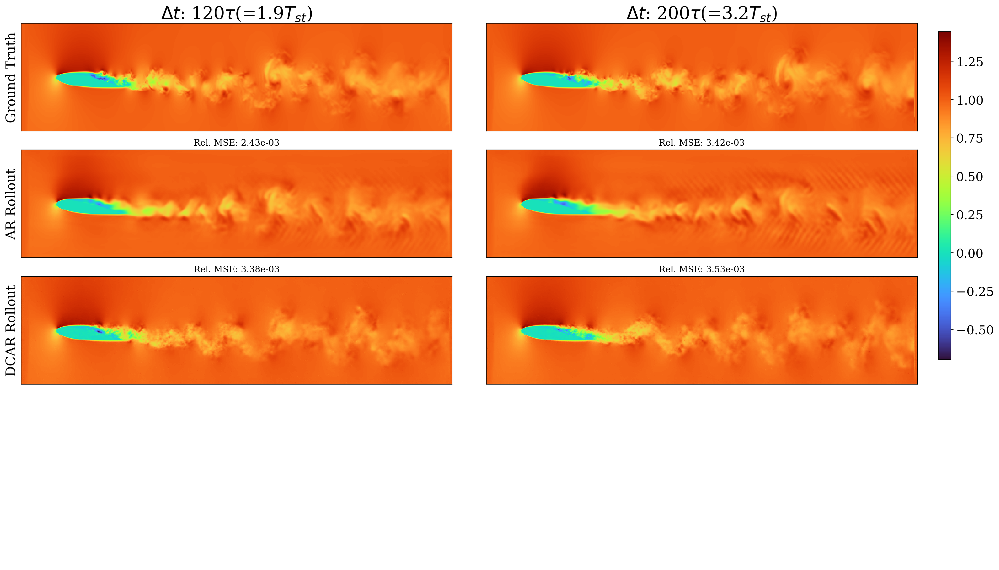


p: 1
(2, 128, 512)
[120 200]
true: (2, 128, 512)
mask: (1, 1, 2, 128, 512)


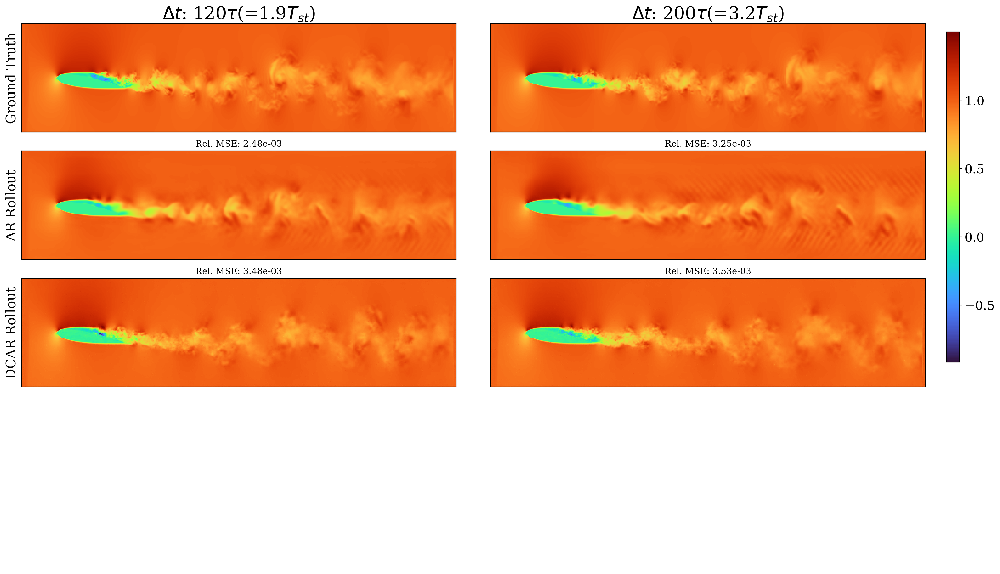


p: 2
(2, 128, 512)
[120 200]
true: (2, 128, 512)
mask: (1, 1, 2, 128, 512)


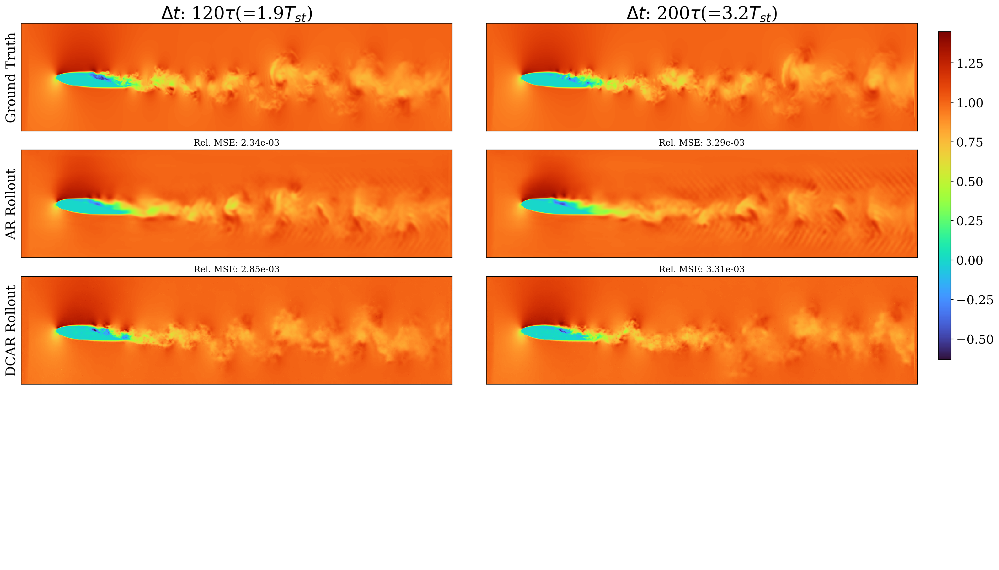


p: 3
(2, 128, 512)
[120 200]
true: (2, 128, 512)
mask: (1, 1, 2, 128, 512)


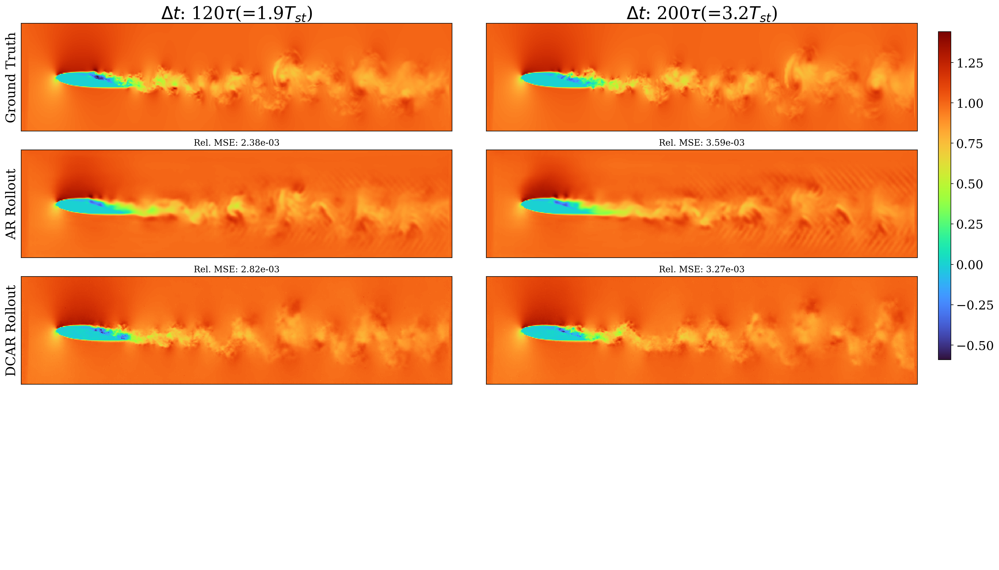


p: 4
(2, 128, 512)
[120 200]
true: (2, 128, 512)
mask: (1, 1, 2, 128, 512)


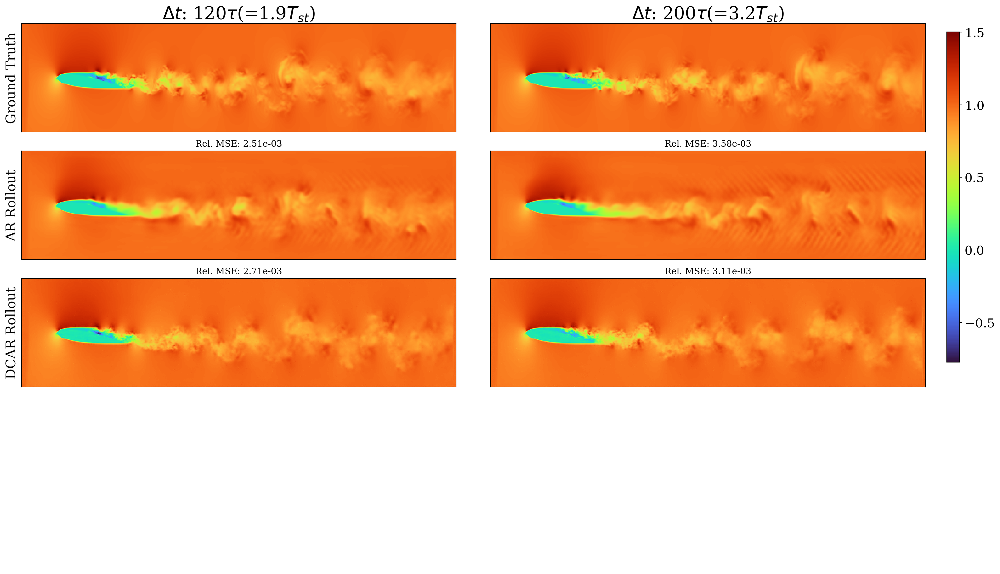


p: 5
(2, 128, 512)
[120 200]
true: (2, 128, 512)
mask: (1, 1, 2, 128, 512)


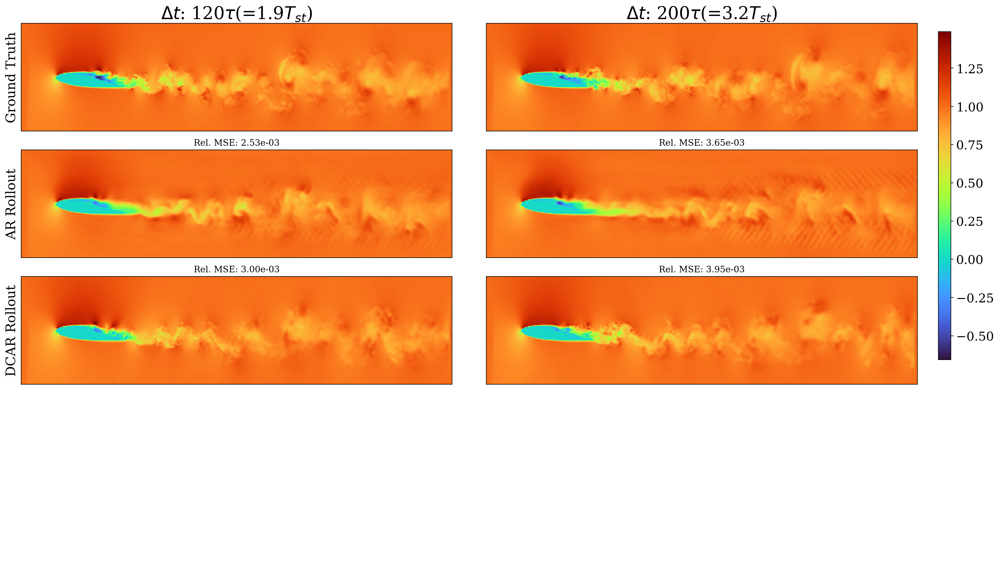


p: 6
(2, 128, 512)
[120 200]
true: (2, 128, 512)
mask: (1, 1, 2, 128, 512)


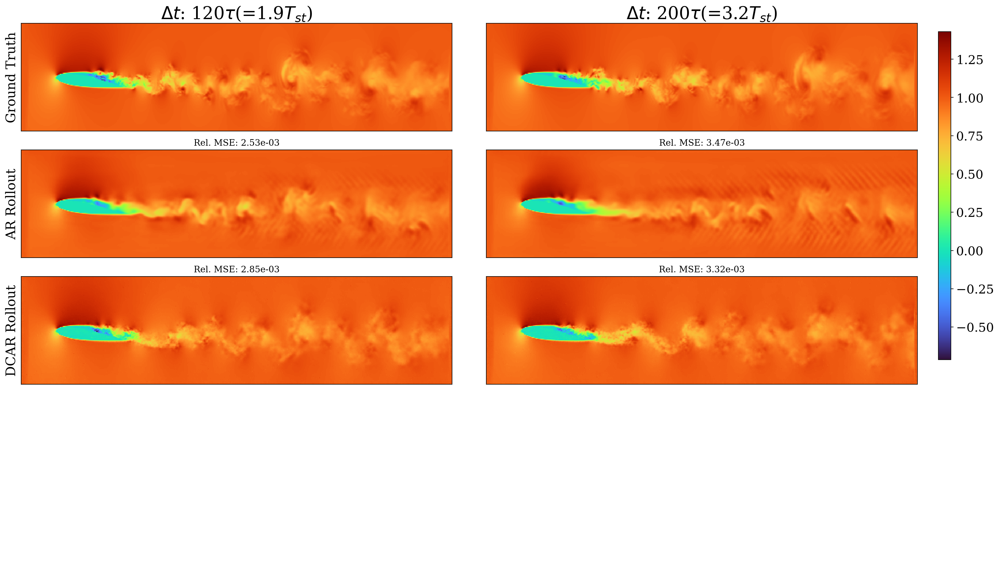


p: 7
(2, 128, 512)
[120 200]
true: (2, 128, 512)
mask: (1, 1, 2, 128, 512)


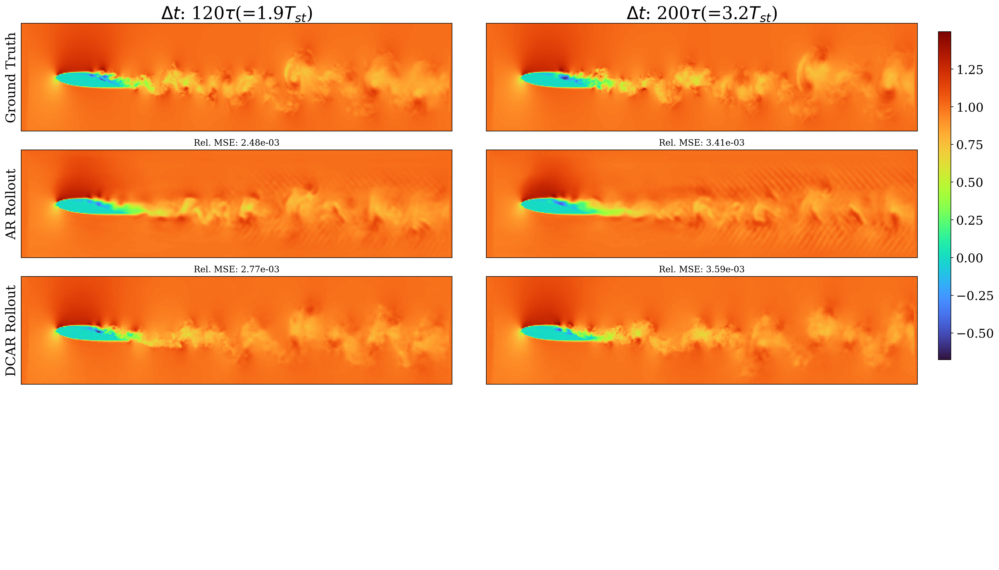


p: 8
(2, 128, 512)
[120 200]
true: (2, 128, 512)
mask: (1, 1, 2, 128, 512)


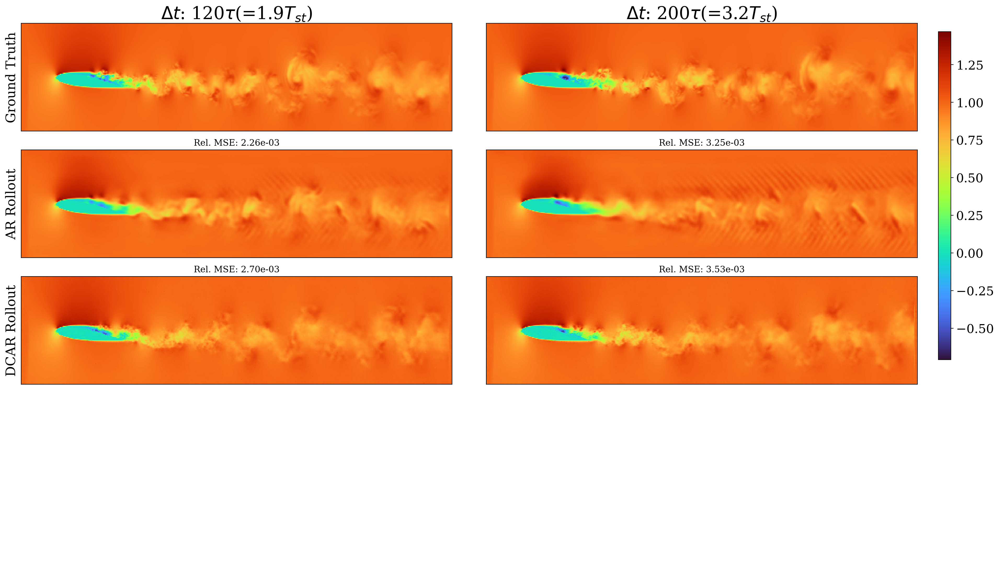


p: 9
(2, 128, 512)
[120 200]
true: (2, 128, 512)
mask: (1, 1, 2, 128, 512)


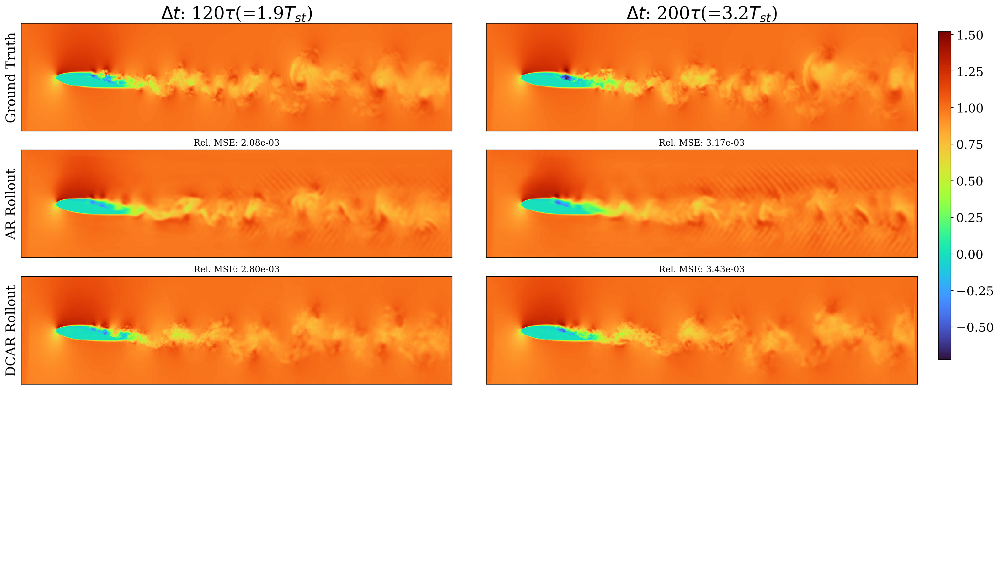


p: 10
(2, 128, 512)
[120 200]
true: (2, 128, 512)
mask: (1, 1, 2, 128, 512)


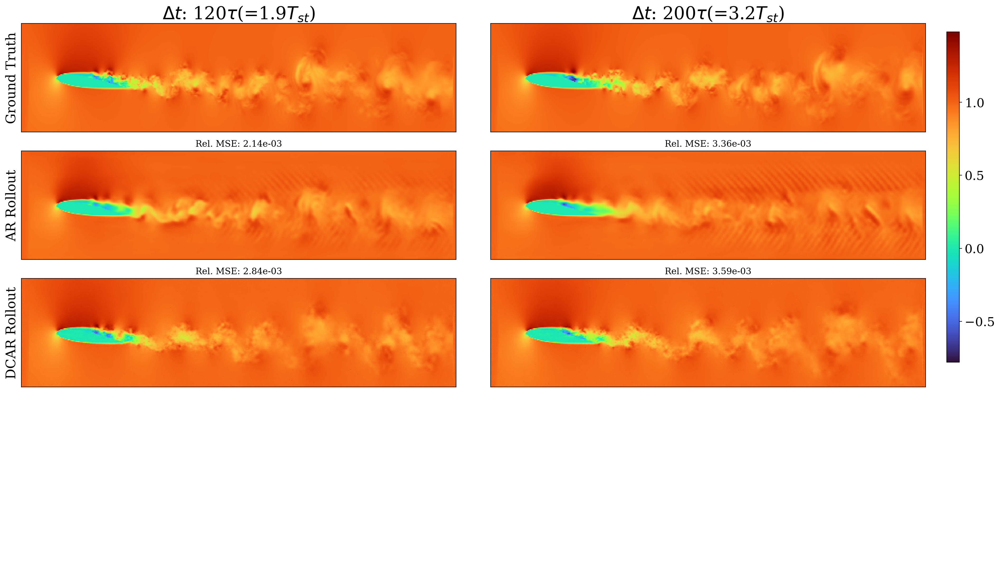


p: 11
(2, 128, 512)
[120 200]
true: (2, 128, 512)
mask: (1, 1, 2, 128, 512)


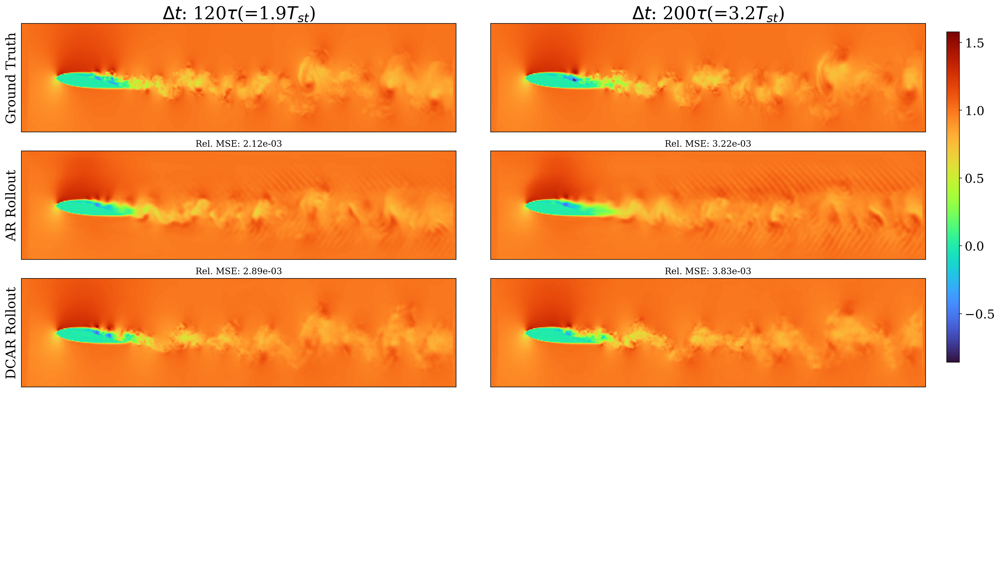


p: 12
(2, 128, 512)
[120 200]
true: (2, 128, 512)
mask: (1, 1, 2, 128, 512)


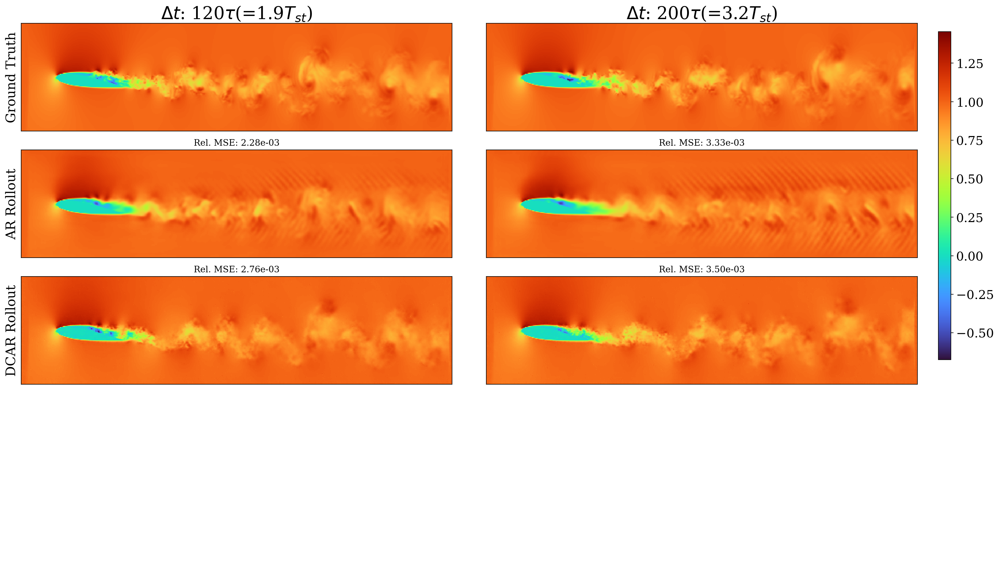


p: 13
(2, 128, 512)
[120 200]
true: (2, 128, 512)
mask: (1, 1, 2, 128, 512)


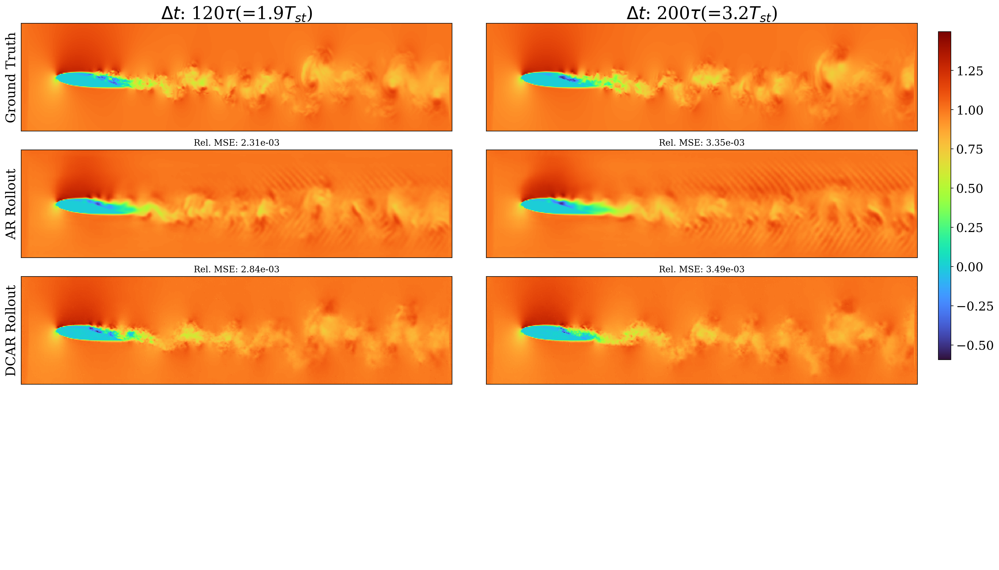


p: 14
(2, 128, 512)
[120 200]
true: (2, 128, 512)
mask: (1, 1, 2, 128, 512)


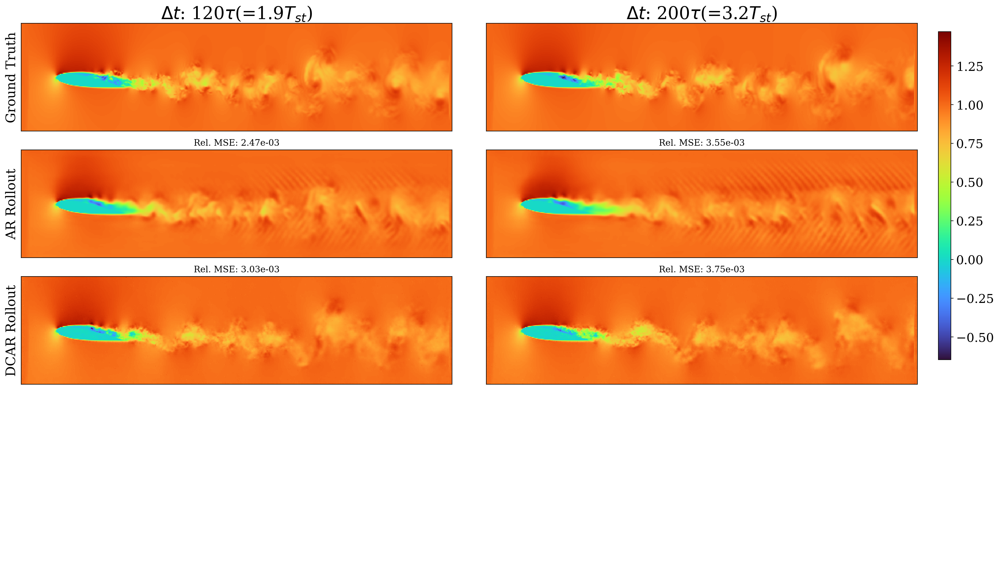


p: 15
(2, 128, 512)
[120 200]
true: (2, 128, 512)
mask: (1, 1, 2, 128, 512)


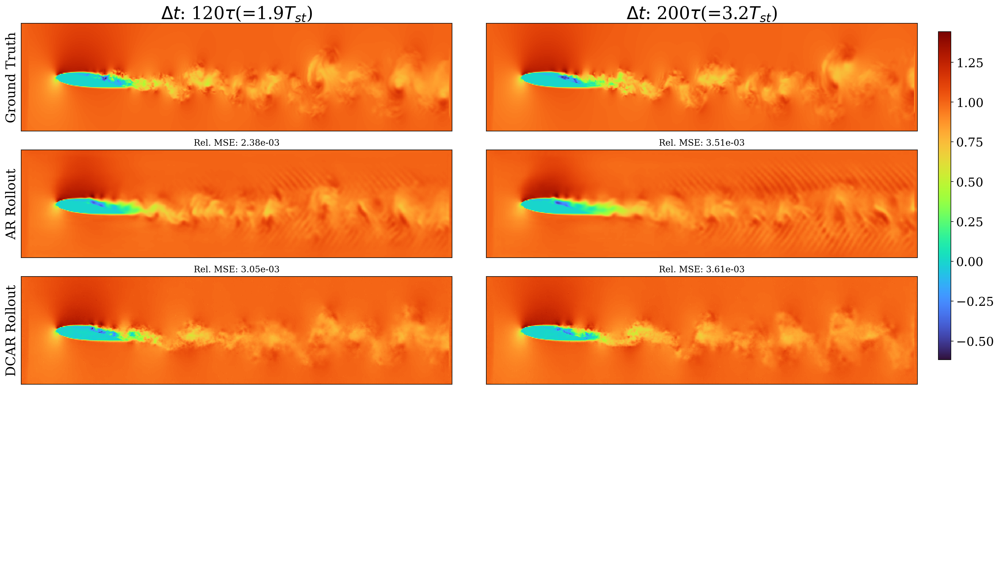


p: 16
(2, 128, 512)
[120 200]
true: (2, 128, 512)
mask: (1, 1, 2, 128, 512)


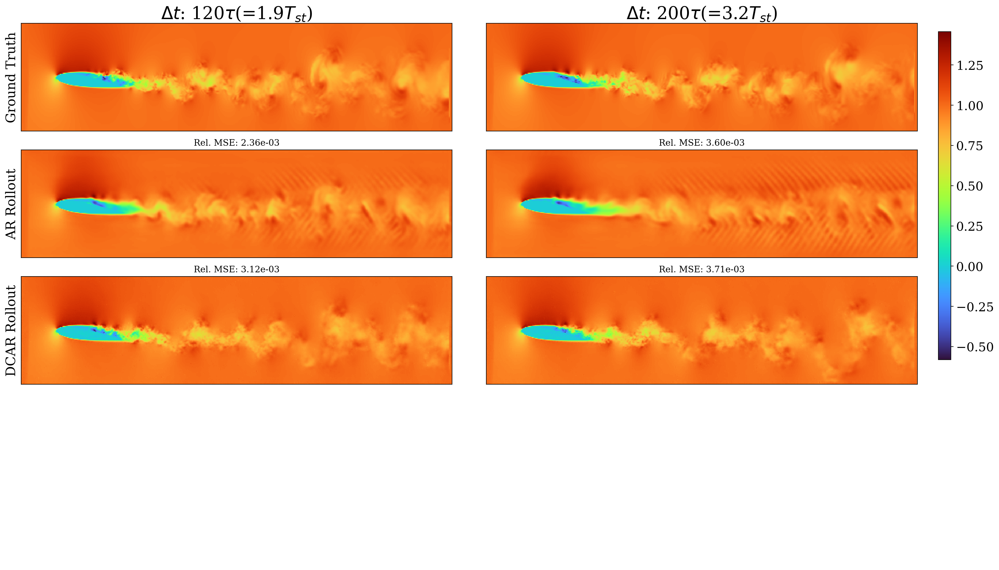


p: 17
(2, 128, 512)
[120 200]
true: (2, 128, 512)
mask: (1, 1, 2, 128, 512)


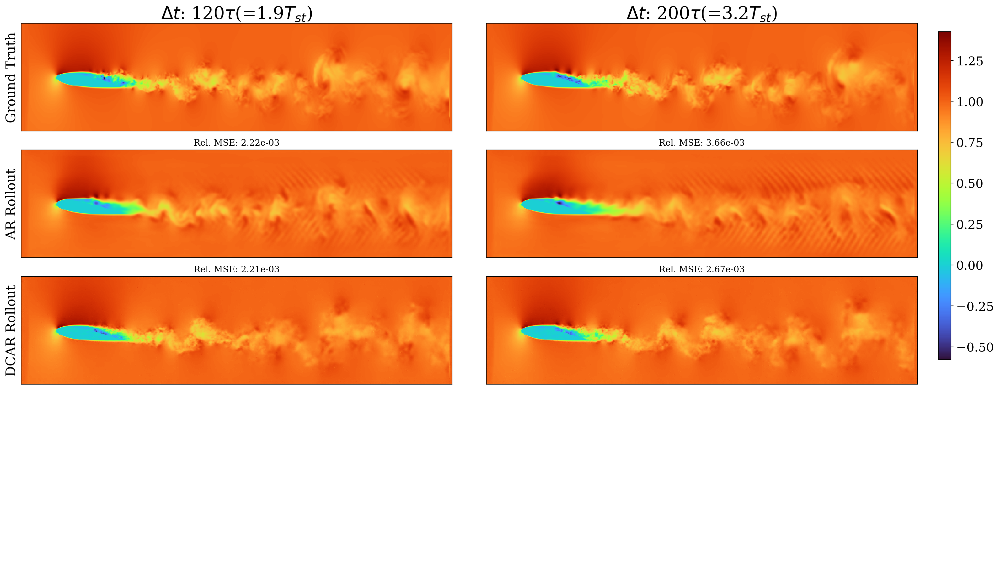


p: 18
(2, 128, 512)
[120 200]
true: (2, 128, 512)
mask: (1, 1, 2, 128, 512)


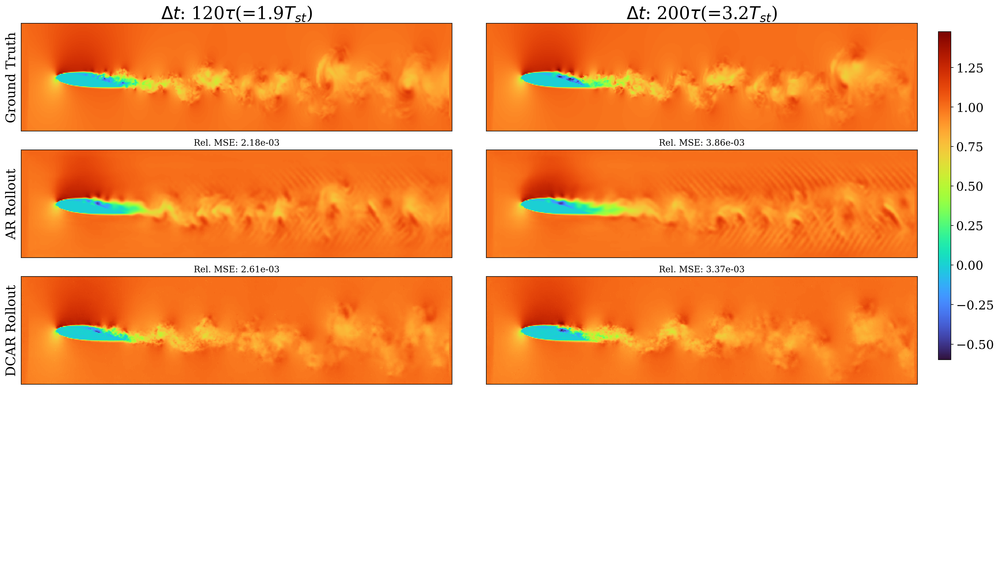


p: 19
(2, 128, 512)
[120 200]
true: (2, 128, 512)
mask: (1, 1, 2, 128, 512)


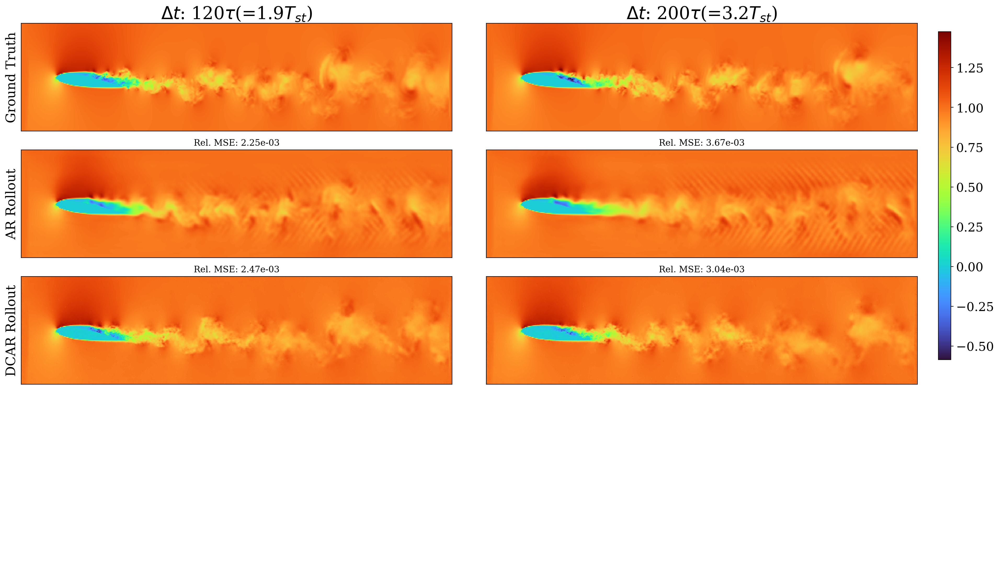


p: 20
(2, 128, 512)
[120 200]
true: (2, 128, 512)
mask: (1, 1, 2, 128, 512)


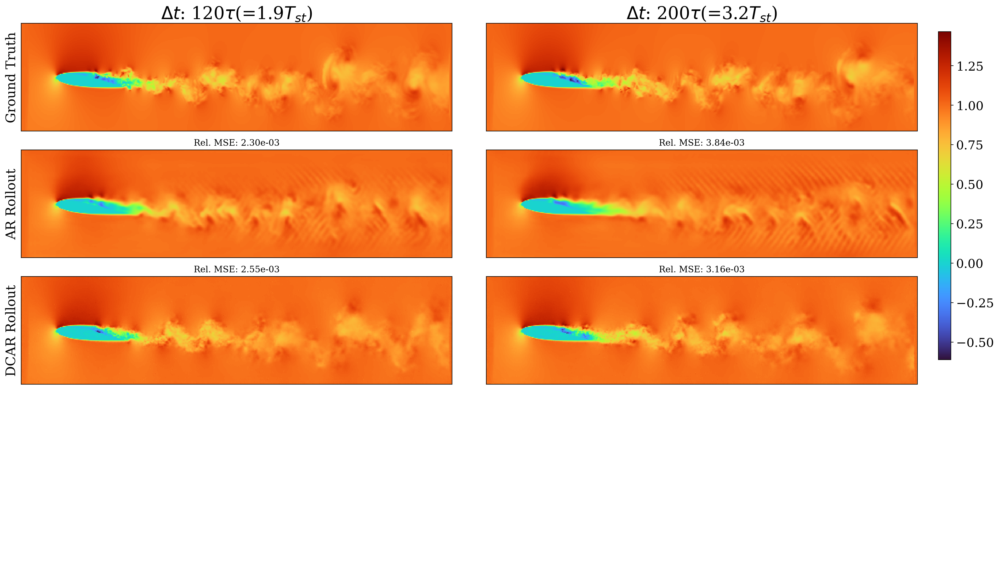

In [33]:
L = 2*np.pi
N = np.min(y_true.shape[2:])
delta_x = L/N
k_nq = np.pi/delta_x
print(f"k_nq: {k_nq}")

for p in range(0,21,1):
    print()
    print(f"p: {p}")
    sample_id = p
    skip_t = 32
    t_id = [23,39]
    t_ls = (np.arange(61)[1:]) * 5
    true = y_true[sample_id, t_id]
    pred1 = y_no[sample_id, t_id]
    pred2 = y_pred[sample_id, t_id]
    time_ls = t_ls[t_id]

    
    
    print(true.shape)
    print(time_ls)
    
    CMAP = "turbo" #"turbo" #'ocean'
    
    # Function to calculate MSE
    def mse(a, b):
        return np.mean((a - b) ** 2)
    
    def rel_l2(T, P):
        T = torch.tensor(T, dtype=DTYPE)
        P = torch.tensor(P, dtype=DTYPE)
        return torch.norm(T-P, p=2)/torch.norm(T, p=2).cpu().numpy()

    def rel_mse(T, P):
        err = np.mean( (T-P)**2 )/np.mean(T**2)
        return err
        
    # Create the figure and axis
    # fig, axes = plt.subplots(4, 3, figsize=(30, 11))
    # cbar_ax = fig.add_axes([0.92, 0.3, 0.02, 0.4])  # Colorbar axis

    fig, axes = plt.subplots(4, len(time_ls), figsize=(20, 11), gridspec_kw={'height_ratios': [1, 1, 1, 1.5]})
    cbar_ax = fig.add_axes([0.9, 0.37, 0.012, 0.57])  # Adjust colorbar positioning [left, bottom, width, height]
    # cbar.ax.tick_params(labelsize=17)

    
    # Find the min and max values for colorbar
    vmin = min(true.min(), pred1.min(), pred2.min())
    vmax = max(true.max(), pred1.max(), pred2.max())

    airfoil_mask = np.expand_dims(mask, axis=0)
    airfoil_mask = np.tile(airfoil_mask, (true.shape[0], 1,1))
    print(f"true: {true.shape}")
    print(f"mask: {airfoil_mask.shape}")

    true_temp  = np.copy(true)
    pred1_temp = np.copy(pred1)
    pred2_temp = np.copy(pred2)
    
    # true_temp[airfoil_mask == 0]  = np.nan
    # pred1_temp[airfoil_mask == 0] = np.nan
    # pred2_temp[airfoil_mask == 0] = np.nan
    
    # Plot the images
    for i in range(2):
        T_st = time_ls[i] * 0.8 / 50

        # Ground truth row
        im = axes[0, i].imshow(true_temp[i], origin='lower', vmin=vmin, vmax=vmax, cmap=CMAP)
        axes[0, i].set_title(r'$\Delta t$: '+f'{time_ls[i]}'+r'$\tau$'+f"(={T_st:.1f}"+r"$T_{st}$)", fontsize=24)
        axes[0, i].set_xticks([])
        axes[0, i].set_yticks([])
    
        # Prediction 1 row
        im = axes[1, i].imshow(pred1_temp[i], origin='lower', vmin=vmin, vmax=vmax, cmap=CMAP)
        err = rel_mse(true[i], pred1[i])
        axes[1, i].set_title(f'Rel. MSE: {err:.2e}', fontsize=12)
        axes[1, i].set_xticks([])
        axes[1, i].set_yticks([])
    
        # Prediction 2 row
        im = axes[2, i].imshow(pred2_temp[i], origin='lower', vmin=vmin, vmax=vmax, cmap=CMAP)
        err = rel_mse(true[i], pred2[i])
        axes[2, i].set_title(f'Rel. MSE: {err:.2e}', fontsize=12)
        axes[2, i].set_xticks([])
        axes[2, i].set_yticks([])

        if i==0:
            axes[0,i].set_ylabel(f"Ground Truth", fontsize=18)
            axes[1,i].set_ylabel(f"AR Rollout", fontsize=18)
            axes[2,i].set_ylabel(f"DCAR Rollout", fontsize=18)

        axes[3,i].axis("off")
    
    
    
        # #######################
    
        # image = true[i]    
        # ny, nx = image.shape
    
        # # Compute the Fourier transform and get the amplitude squared
        # fourier_image = np.fft.fftn(image)
        # fourier_amplitudes = np.abs(fourier_image)**2
        
        # # Create the k-frequency grid
        # kfreq_y = np.fft.fftfreq(ny) * ny
        # kfreq_x = np.fft.fftfreq(nx) * nx
        # kfreq2D_x, kfreq2D_y = np.meshgrid(kfreq_x, kfreq_y)
        # knrm = np.sqrt(kfreq2D_x**2 + kfreq2D_y**2)
        
        # # Flatten the arrays to use in binning
        # knrm = knrm.flatten()
        # fourier_amplitudes = fourier_amplitudes.flatten()
        
        # # Define the bins for the wavenumber
        # kbins = np.arange(0.5, min(nx, ny)//2+1, 1.)
        # kvals = 0.5 * (kbins[1:] + kbins[:-1])
        # kvals = kvals / (0.5*N) * k_nq
        
        
        # # Bin the data
        # Abins, _, _ = stats.binned_statistic(knrm, fourier_amplitudes,
        #                                      statistic="mean",
        #                                      bins=kbins)
        
        # # Scale the binned amplitudes
        # Abins *= np.pi * (kbins[1:]**2 - kbins[:-1]**2)
        
        # # Plotting    
        # axes[3, i].loglog(kvals, Abins, c='black', label="Ground Truth", linewidth=3)
    
    
        
        # image = pred1[i]    
        # ny, nx = image.shape
    
        # # Compute the Fourier transform and get the amplitude squared
        # fourier_image = np.fft.fftn(image)
        # fourier_amplitudes = np.abs(fourier_image)**2
        
        # # Create the k-frequency grid
        # kfreq_y = np.fft.fftfreq(ny) * ny
        # kfreq_x = np.fft.fftfreq(nx) * nx
        # kfreq2D_x, kfreq2D_y = np.meshgrid(kfreq_x, kfreq_y)
        # knrm = np.sqrt(kfreq2D_x**2 + kfreq2D_y**2)
        
        # # Flatten the arrays to use in binning
        # knrm = knrm.flatten()
        # fourier_amplitudes = fourier_amplitudes.flatten()
        
        # # Define the bins for the wavenumber
        # kbins = np.arange(0.5, min(nx, ny)//2+1, 1.)
        # kvals = 0.5 * (kbins[1:] + kbins[:-1])
        # kvals = kvals / (0.5*N) * k_nq
        
        # # Bin the data
        # Abins, _, _ = stats.binned_statistic(knrm, fourier_amplitudes,
        #                                      statistic="mean",
        #                                      bins=kbins)
        
        # # Scale the binned amplitudes
        # Abins *= np.pi * (kbins[1:]**2 - kbins[:-1]**2)    
        
        
        # # Plotting    
        # axes[3, i].loglog(kvals, Abins, label="NO", c='blue', linewidth=2)
    
    
    
    
        # image = pred2[i]    
        # ny, nx = image.shape
    
        # # Compute the Fourier transform and get the amplitude squared
        # fourier_image = np.fft.fftn(image)
        # fourier_amplitudes = np.abs(fourier_image)**2
        
        # # Create the k-frequency grid
        # kfreq_y = np.fft.fftfreq(ny) * ny
        # kfreq_x = np.fft.fftfreq(nx) * nx
        # kfreq2D_x, kfreq2D_y = np.meshgrid(kfreq_x, kfreq_y)
        # knrm = np.sqrt(kfreq2D_x**2 + kfreq2D_y**2)
        
        # # Flatten the arrays to use in binning
        # knrm = knrm.flatten()
        # fourier_amplitudes = fourier_amplitudes.flatten()
        
        # # Define the bins for the wavenumber
        # kbins = np.arange(0.5, min(nx, ny)//2+1, 1.)
        # kvals = 0.5 * (kbins[1:] + kbins[:-1])
        # kvals = kvals / (0.5*N) * k_nq
            
        # # Bin the data
        # Abins, _, _ = stats.binned_statistic(knrm, fourier_amplitudes,
        #                                      statistic="mean",
        #                                      bins=kbins)
        
        # # Scale the binned amplitudes
        # Abins *= np.pi * (kbins[1:]**2 - kbins[:-1]**2)    
        
        
        # # Plotting    
        # axes[3, i].loglog(kvals, Abins, label="NO+Diffusion", c='red', linewidth=2)

        # axes[3, i].set_ylim(9*10**2,2*10**8)

        # for ax in axes[3, :]:  # Adjusting only the last row axes
        #     ax.tick_params(axis='both', which='major', labelsize=17)
        
        # if i!=0:
        #     axes[3,i].get_yaxis().set_visible(False)
    
    
        
    
        # # Adding the -5/3 slope line
        # k_ref = np.linspace(1, np.max(kbins), 100)  # Range of wavenumber for the reference line
        # energy_ref = k_ref**(-5/3)  # Energy corresponding to the -5/3 slope
        # energy_ref *= max(Abins) / max(energy_ref)  # Normalize to plot scale    
    
        # axes[3, i].set_xlabel('$k$', fontsize=20)
        # if i == 1:
        #     # axes[3, i].loglog(k_ref, 10*energy_ref, 'k--', label='k^-5/3 Reference', linewidth=2)
        #     leg = axes[3, i].legend()
        #     # axes[3, i1].legend(loc='upper \left', bbox_to_anchor=(1.05, 1), frameon=False)
        #     handles, labels = axes[3, i].get_legend_handles_labels()

        #     # Remove the original legend from the axes
        #     leg.remove()
            
        #     # Define custom coordinates for the new legend (adjust these values to your liking)
        #     custom_x = 0.81  # Adjust this value to move left-right
        #     custom_y = 0.10  # Adjust this value to move up-down
            
        #     # Create a new standalone legend at the custom coordinates on the figure
        #     fig.legend(handles, labels, loc='lower left', bbox_to_anchor=(custom_x, custom_y), fontsize=19)


        # # axes[3,i].set_aspect(1/3)
        # axes[3,i].set_aspect(1/3)
    
        # ################## 
    
        
    
    
    
    
    
    # Add row labels
    # Add row labels
    # fig.text(0.01, 0.87, 'Ground truth', va='center', ha='center', rotation='vertical', fontsize=18)
    # fig.text(0.01, 0.67, 'Neural Operator', va='center', ha='center', rotation='vertical', fontsize=18)
    # fig.text(-0.00, 0.46, 'Neural Operator\n+\nDiffusion Model', va='center', ha='center', rotation='vertical', fontsize=18)
    # fig.text(0.11, 0.20, r'Energy $P(k)$', va='center', ha='center', rotation='vertical', fontsize=20)
    
    # Adjust layout
    fig.tight_layout(rect=[0, 0, 0.9, 1])
    # fig.colorbar(im, cax=cbar_ax)
    cbar = fig.colorbar(im, cax=cbar_ax)
    cbar.ax.tick_params(labelsize=17)
    plt.show()

In [34]:
1+2

3

In [35]:
y_true.shape, y_no.shape, y_pred.shape

((21, 60, 128, 512), (31, 60, 128, 512), (21, 60, 128, 512))

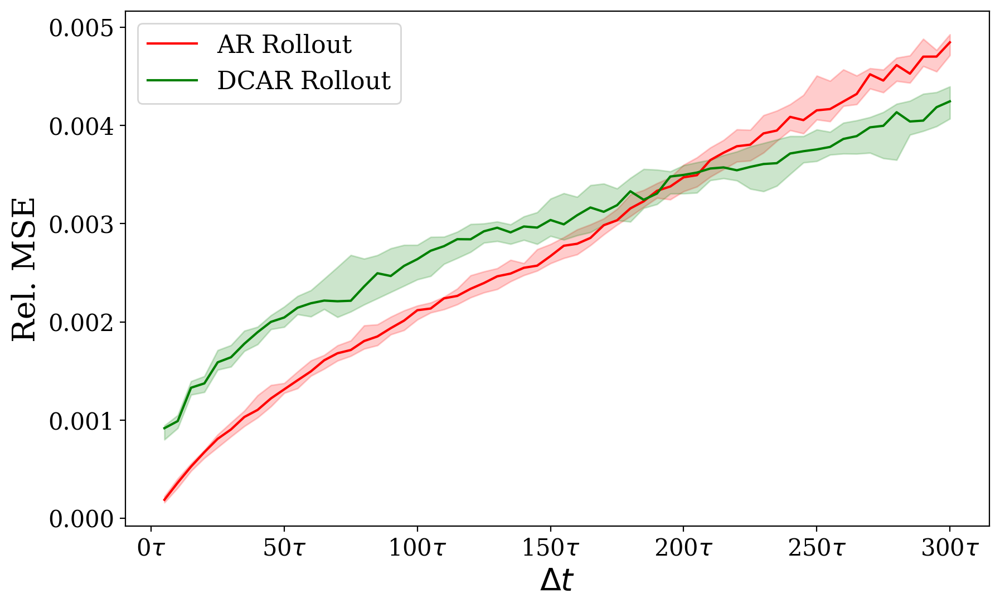

In [36]:
# Compute the mean squared error
# err = np.mean((TRUE - PRED) ** 2, axis=(2, 3))
# err_rba = np.mean((TRUE - PRED_rba) ** 2, axis=(2, 3))

def error_metric(y_true, y_pred):
    y_true = torch.tensor(y_true, dtype=DTYPE)
    y_pred = torch.tensor(y_pred, dtype=DTYPE)
    # loss = (torch.norm(y_true-y_pred, p=2, dim=(2,3))/torch.norm(y_true, p=2, dim=(2,3))).detach().cpu().numpy()
    loss = ( torch.mean( (y_true-y_pred)**2, dim=(2,3) )/torch.mean( (y_true)**2, dim=(2,3) ) ) .detach().cpu().numpy()
    return loss
    

err_no = error_metric(y_true, y_no[:21])
err_no_diff = error_metric(y_true, y_pred)

# Compute the mean and standard deviation across the samples (axis=0)
mean_err_no = np.mean(err_no, axis=0)
std_err_no = np.std(err_no, axis=0)

mean_err_no_diff = np.mean(err_no_diff, axis=0)
std_err_no_diff = np.std(err_no_diff, axis=0)

# Compute the 25th and 75th percentiles across the samples (axis=0)
percentile_25_err_no = np.percentile(err_no, 25, axis=0)
percentile_50_err_no = np.percentile(err_no, 50, axis=0)
percentile_75_err_no = np.percentile(err_no, 75, axis=0)
percentile_25_err_no_diff = np.percentile(err_no_diff, 25, axis=0)
percentile_50_err_no_diff = np.percentile(err_no_diff, 50, axis=0)
percentile_75_err_no_diff = np.percentile(err_no_diff, 75, axis=0)

# Time steps
nt = y_true.shape[1]
timesteps = np.linspace(0,nt,nt+1)[1:]*5

xticks_positions = np.arange(0, timesteps[-1] + 1, 50)
xticks_labels = [f"{int(t)}"+r"$\tau$" for t in xticks_positions]


# Plotting
plt.figure(figsize=(10, 6))

# Plot for err
plt.plot(timesteps, percentile_50_err_no, color='red', label='AR Rollout')
plt.fill_between(timesteps, percentile_25_err_no, percentile_75_err_no, color='red', alpha=0.2)

# Plot for err_rba
plt.plot(timesteps, percentile_50_err_no_diff, color='green', label='DCAR Rollout')
plt.fill_between(timesteps, percentile_25_err_no_diff, percentile_75_err_no_diff, color='green', alpha=0.2)

# Add labels and legend
plt.xlabel(r'$\Delta t$', fontsize=20)
plt.ylabel('Rel. MSE', fontsize=20)
plt.legend(fontsize=16)
# plt.xticks(fontsize=15)
plt.xticks(xticks_positions, xticks_labels, fontsize=15)
plt.yticks(fontsize=15)

# plt.yscale("log")
# plt.grid(True)
plt.show()